In [41]:
#Plots and Graphs
using Pkg
Pkg.add("Plots")
using Plots

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.11/Project.toml`
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`


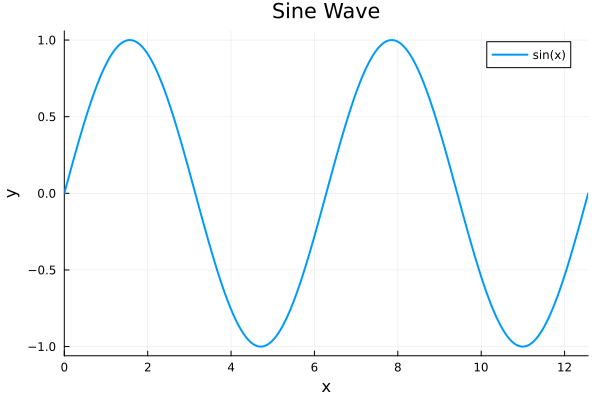

In [42]:
x = 0:0.001:4π #Start : Step size : End 
y = sin.(x) #Function

plot(x, y, label="sin(x)", xlabel="x", ylabel="y", title="Sine Wave", linewidth=2,xlims=(0,4π))




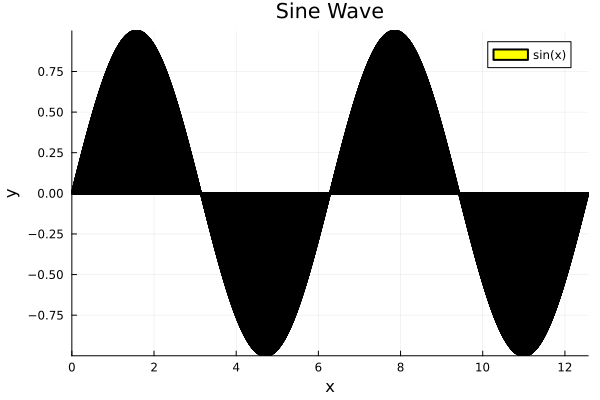

In [43]:
bar(x, y, label="sin(x)", xlabel="x", ylabel="y", title="Sine Wave", linewidth=2,xlims=(0,4π),color=:yellow)

In [44]:
#using Pkg
#Pkg.add("DataFrames")
#Pkg.add("CSV")
#Pkg.add("GLM")


In [45]:
using CSV
using GLM
using DataFrames
x = 1:100
#Y = X*4 + 3
y = [ i *30 + 1+pi for i in x ]

data = DataFrame(x=x,y=y)

Row,x,y
,Int64,Float64
1,1,34.1416
2,2,64.1416
3,3,94.1416
4,4,124.142
5,5,154.142
6,6,184.142
7,7,214.142
8,8,244.142
9,9,274.142


In [46]:
model = lm(@formula(y~x),data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y ~ 1 + x

Coefficients:
────────────────────────────────────────────────────────────────────────────────────────
                Coef.   Std. Error                     t  Pr(>|t|)  Lower 95%  Upper 95%
────────────────────────────────────────────────────────────────────────────────────────
(Intercept)   4.14159  1.53803e-13     26927862840464.77    <1e-99    4.14159    4.14159
x            30.0      2.64413e-15  11345897349650990.00    <1e-99   30.0       30.0
────────────────────────────────────────────────────────────────────────────────────────

In [47]:
coeftable(model)

|             |    Coef. |  Std. Error |                    t | Pr(>|t|) | Lower 95% | Upper 95% |
|:------------|---------:|------------:|---------------------:|:---------|:----------|----------:|
| (Intercept) |  4.14159 | 1.53803e-13 |    26927862840464.77 |   <1e-99 |   4.14159 |   4.14159 |
| x           | 30.0     | 2.64413e-15 | 11345897349650990.00 |   <1e-99 |  30.0     |  30.0 |

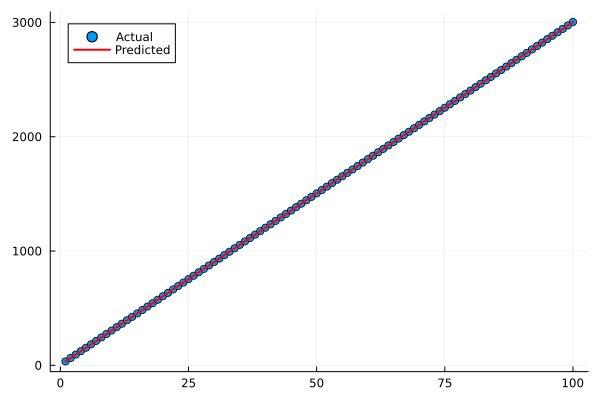

In [48]:
using Plots

scatter(data.x, data.y, label="Actual")
plot!(data.x, predict(model), label="Predicted", color=:red,lw=2)


In [49]:
using DataFrames

data = DataFrame(
    x1 = [1, 2, 3, 4, 5],
    x2 = [2, 4, 6, 8, 10],
    x3 = [5, 3, 6, 2, 1],
    y  = [10, 12, 15, 18, 20]
)


Row,x1,x2,x3,y
,Int64,Int64,Int64,Int64
1,1,2,5,10
2,2,4,3,12
3,3,6,6,15
4,4,8,2,18
5,5,10,1,20


In [50]:
using GLM

model = lm(@formula(y ~ x1 + x2 + x3), data)


StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y ~ 1 + x1 + x2 + x3

Coefficients:
────────────────────────────────────────────────────────────────────────────
                Coef.   Std. Error       t  Pr(>|t|)   Lower 95%   Upper 95%
────────────────────────────────────────────────────────────────────────────
(Intercept)  6.93187     0.996085     6.96    0.0200    2.64606    11.2177
x1           0.0       NaN          NaN       NaN     NaN         NaN
x2           1.31978     0.0950534   13.88    0.0051    0.910799    1.72876
x3           0.043956    0.144955     0.30    0.7903   -0.579735    0.667647
────────────────────────────────────────────────────────────────────────────

In [51]:
new_data = DataFrame(
    x1 = [6, 7],
    x2 = [12, 14],
    x3 = [0, 4]
)

predictions = predict(model, new_data)
println(predictions)


Union{Missing, Float64}[22.769230769230777, 25.584615384615436]
